In [1]:
import torch
import cv2
import os

In [2]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from IPython.display import Image

Cloning the yolov5 pretrained version from github

In [4]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [5]:
%cd yolov5

/content/yolov5


Importing the annotated dataset from roboflow.

Used roboflow annotation tool to annotate the images

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="uAdk3DElNz0nWTwG96oc")
project = rf.workspace("computer-vision-iwlzu").project("comp.vision")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Comp.Vision-1 in yolov5pytorch:: 100%|██████████| 1178/1178 [00:00<00:00, 1660.15it/s]


Training the model 

In [8]:
!python train.py --img 416 --batch 16 --epochs 30 --data '/content/yolov5/Comp.Vision-1/data.yaml' --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Comp.Vision-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: YOLOv5 requirements "ipython" "thop>=0.1.1" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 2 packages updated per /content/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for upda

In [8]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Displaying sample of detected images on train set

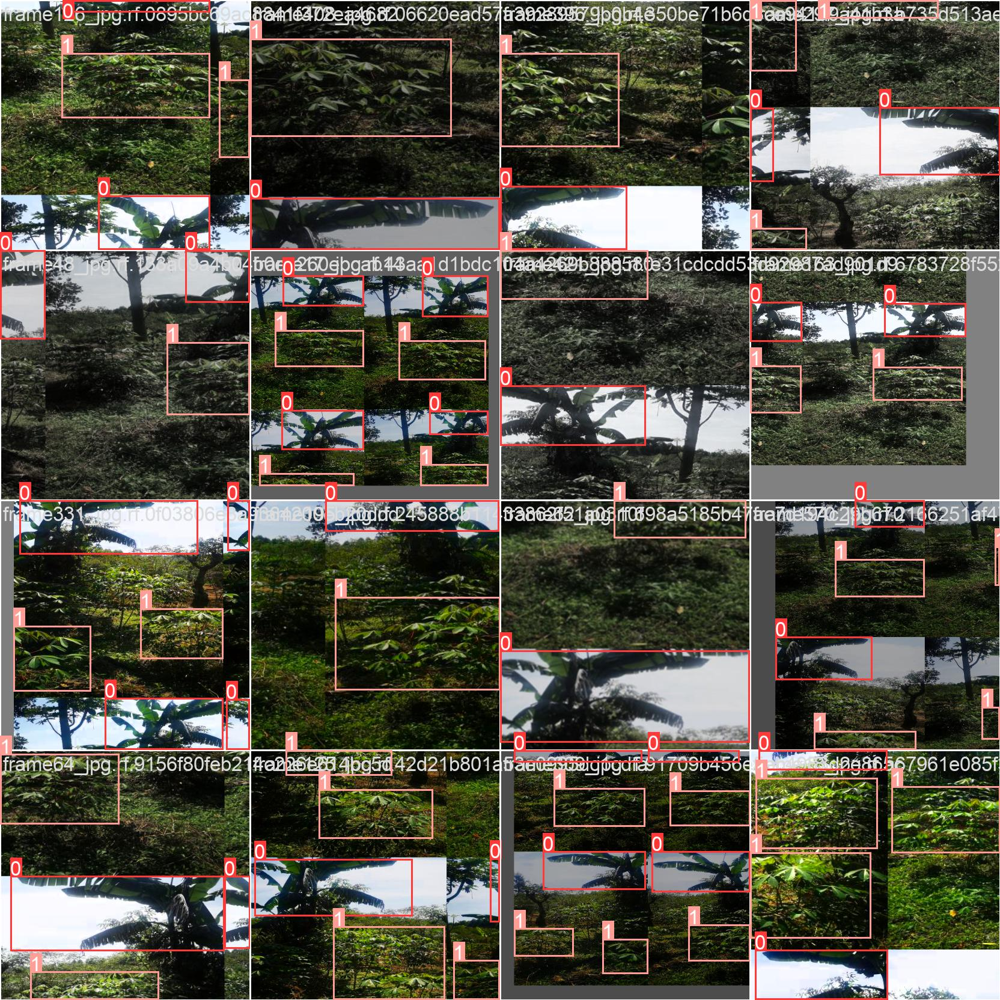

In [9]:
Image(filename = '/content/yolov5/runs/train/exp/train_batch0.jpg', width =1000)

Testing the image on unseen data.
Used the pretrained test file in yolov5: detect.py 

In [11]:
!python detect.py --source '/content/yolov5/Comp.Vision-1/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg' --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/Comp.Vision-1/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-187-g5ef69ef Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/Comp.Vision-1/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg: 640x640 1 Banana, 1 cassava, 12.7ms
Speed: 0.6ms pre-process, 12.7ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/d

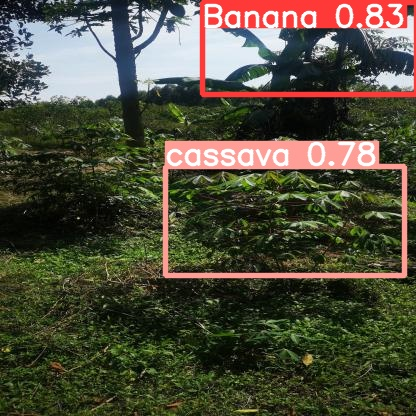

In [14]:
Image(filename = '/content/yolov5/runs/detect/exp2/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg', width = 416)

In [ ]:
!python detect.py --source '/content/yolov5/runs/train/exp/frame19_jpg.rf.fe61cc6fd1639265ab5e0bbb779a76fb.jpg' --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/frame19_jpg.rf.fe61cc6fd1639265ab5e0bbb779a76fb.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-178-g799e3d0 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/frame19_jpg.rf.fe61cc6fd1639265ab5e0bbb779a76fb.jpg: 640x640 1 Banana, 1 cassava, 12.7ms
Speed: 0.5ms pre-process, 12.7ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


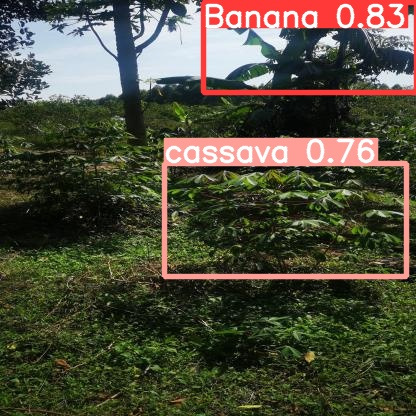

In [ ]:
Image(filename = '/content/yolov5/runs/detect/exp3/frame19_jpg.rf.fe61cc6fd1639265ab5e0bbb779a76fb.jpg', width = 416)

In [ ]:
!python detect.py --source '/content/yolov5/runs/train/exp/frame69_jpg.rf.9e32f615c88424be6518ae600e7468bf.jpg' --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/frame69_jpg.rf.9e32f615c88424be6518ae600e7468bf.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-178-g799e3d0 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/frame69_jpg.rf.9e32f615c88424be6518ae600e7468bf.jpg: 640x640 1 Banana, 1 cassava, 12.7ms
Speed: 0.6ms pre-process, 12.7ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


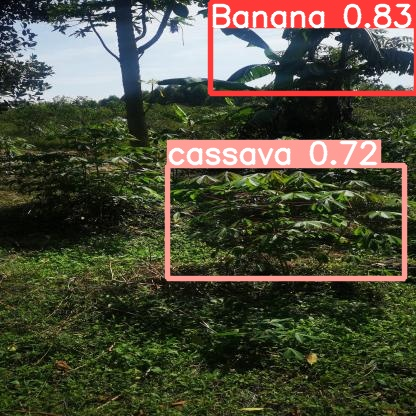

In [ ]:
Image(filename = '/content/yolov5/runs/detect/exp4/frame69_jpg.rf.9e32f615c88424be6518ae600e7468bf.jpg', width = 416)

In [ ]:
!python detect.py --source='/content/yolov5/runs/train/exp/frame29_jpg.rf.8acba0c7cd92704ad215e78b736587bb.jpg' --weights '/content/yolov5/runs/train/exp/weights/best.pt'

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/frame29_jpg.rf.8acba0c7cd92704ad215e78b736587bb.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-178-g799e3d0 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/frame29_jpg.rf.8acba0c7cd92704ad215e78b736587bb.jpg: 640x640 1 Banana, 1 cassava, 12.7ms
Speed: 0.5ms pre-process, 12.7ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp5


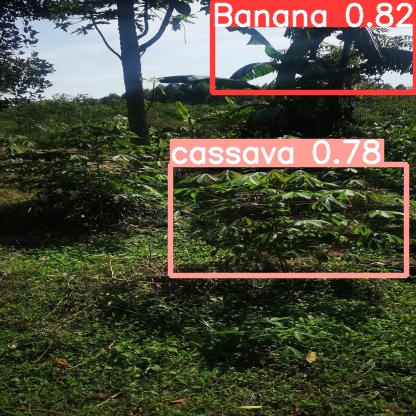

In [ ]:
Image(filename = '/content/yolov5/runs/detect/exp5/frame29_jpg.rf.8acba0c7cd92704ad215e78b736587bb.jpg', width = 416)